In [33]:
import clean
# import pytorch libraries
%matplotlib inline
import numpy as np
import pickle
import pandas as pd
import torch 
import torch.autograd as autograd 
import torch.nn as nn 
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, Dataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso
from sklearn.model_selection import cross_val_score
import spacy
import matplotlib.pyplot as plt
import seaborn as sns



In [74]:
pickle_file_path = 'train.pickle'
pickle_file_path_test = 'test_kaggle.pickle'

In [75]:
dataframe_train = clean.open_pic(pickle_file_path)
dataframe_test = clean.open_pic(pickle_file_path_test)
dataframe_train


,price,title,loc_string,loc,features,type,subtype,selltype,desc
0,320.000 €,Piso Tallers. Piso con 2 habitaciones con asce...,Barcelona - Sant Antoni,None,"[85 m2, 2 hab., 1 baño, 3.647 €/m2]",FLAT,FLAT,SECOND_HAND,Piso en última planta a reformar en calle Tall...
1,335.000 €,Piso C/ de valència. Piso reformado en venta d...,Barcelona - Dreta de l´Eixample,None,"[65 m2, 2 hab., 1 baño, 5.000 €/m2]",FLAT,FLAT,SECOND_HAND,"Ubicado en la zona del Camp de l’Arpa, cerca d..."
2,330.000 €,Piso en Dreta de l´Eixample. Acogedor piso al ...,Barcelona - Dreta de l´Eixample,None,"[77 m2, 2 hab., 1 baño, 4.286 €/m2]",FLAT,FLAT,SECOND_HAND,"En pleno centro de Barcelona, justo al lado de..."
3,435.000 €,"Piso Barcelona - corts catalanes. Soleado, cén...",Barcelona - Sant Antoni,None,"[96 m2, 3 hab., 2 baños, 4.531 €/m2]",FLAT,FLAT,SECOND_HAND,"Vivienda espaciosa en Sant Antoni, cerca de Pl..."
4,410.000 €,"Piso en Carrer de sardenya 271. Alto, reformad...",Barcelona - Sagrada Família,Carrer de Sardenya 271,"[84 m2, 2 hab., 1 baño, 4.881 €/m2]",FLAT,FLAT,SECOND_HAND,"En el corazón de Barcelona, en una hermosa fin..."
...,...,...,...,...,...,...,...,...,...
861,342.000 €,Piso Meridiana,Barcelona - Navas,None,"[115 m2, 3 hab., 1 baño, 2.974 €/m2]",FLAT,FLAT,SECOND_HAND,"HANNAN-PIPER Real Estate les presenta, en excl..."
862,315.000 €,Piso en Navas. Piso con 3 habitaciones,Barcelona - Navas,None,"[82 m2, 3 hab., 1 baño, 3.841 €/m2]",FLAT,FLAT,SECOND_HAND,¡ OPORTUNIDAD !\n\nLa Casa Agency vende: Vivie...
863,360.000 €,Piso Carrer de sant antoni maria claret. Piso ...,Barcelona - Navas,None,"[79 m2, 4 hab., 2 baños, 4.557 €/m2]",FLAT,FLAT,SECOND_HAND,"Piso totalmente REFORMADO y a ESTRENAR, con MU..."
864,270.000 €,Piso Carrer del clot. Piso con calefacción y a...,Barcelona - Navas,None,"[63 m2, 1 hab., 1 baño, 4.286 €/m2]",FLAT,FLAT,SECOND_HAND,Presentamos la oportunidad de comprar un bonit...


In [73]:
dataframe_train_clean = clean.cleaning(dataframe_train)
print(dataframe_train_clean)
dataframe_test_clean = clean.cleaning_test(dataframe_test)
dataframe_train_clean.drop('LOFT', axis=1, inplace=True)
dataframe_train_clean.drop('DUPLEX', axis=1, inplace=True)


     price                                               desc  square_m  hab  \
0    320.0  Piso en última planta a reformar en calle Tall...      85.0  2.0   
1    335.0  Ubicado en la zona del Camp de l’Arpa, cerca d...      65.0  2.0   
2    330.0  En pleno centro de Barcelona, justo al lado de...      77.0  2.0   
3    435.0  Vivienda espaciosa en Sant Antoni, cerca de Pl...      96.0  3.0   
4    410.0  En el corazón de Barcelona, en una hermosa fin...      84.0  2.0   
..     ...                                                ...       ...  ...   
861  342.0  HANNAN-PIPER Real Estate les presenta, en excl...     115.0  3.0   
862  315.0  ¡ OPORTUNIDAD !\n\nLa Casa Agency vende: Vivie...      82.0  3.0   
863  360.0  Piso totalmente REFORMADO y a ESTRENAR, con MU...      79.0  4.0   
864  270.0  Presentamos la oportunidad de comprar un bonit...      63.0  1.0   
865  225.0  Piso de 80 metros totalmente reformado en Sagr...      80.0  2.0   

     bano  APARTMENT  DUPLEX  FLAT  GRO

In [37]:
dataframe_train_tf, dataframe_test_tf = clean.prepare_tokenized_features(dataframe_train_clean,dataframe_test_clean,'desc')
dataframe_train_tf.drop('desc', axis=1, inplace=True)
dataframe_test_tf.drop('desc', axis=1, inplace=True)
dataframe_test_tf.drop('description', axis=1, inplace=True)


In [38]:
nan_locations = np.where(dataframe_train_tf.isna())
print(nan_locations)
rows_to_drop = [16, 137, 186, 192, 403, 503, 537, 574, 766, 808]

# Drop these rows
df_dropped_rows = dataframe_train_tf.drop(index=rows_to_drop)

(array([ 16, 137, 186, 192, 403, 503, 537, 574, 766, 808]), array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3]))


In [39]:
df_dropped_rows.tail(5)

,price,square_m,hab,bano,APARTMENT,FLAT,GROUND_FLOOR,PENTHOUSE,STUDIO,000,...,vistas,vivienda,viviendas,vivir,vía,with,zona,zonas,única,útiles
861,342.0,115.0,3.0,1.0,0,1,0,0,0,0,...,0,4,0,1,0,0,3,0,0,0
862,315.0,82.0,3.0,1.0,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,1
863,360.0,79.0,4.0,2.0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
864,270.0,63.0,1.0,1.0,0,1,0,0,0,1,...,1,0,0,0,0,0,1,0,0,0
865,225.0,80.0,2.0,1.0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [40]:
y = df_dropped_rows['price']
df_dropped_rows.drop('price', axis=1, inplace=True)
X = df_dropped_rows.select_dtypes(include=[np.number])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

In [41]:
X_train.shape

(684, 608)

In [42]:
n_estiamtors = [10,100,200,500,1000]
max_depth = [5,10,30,50,100]

In [43]:
results = []
for n in n_estiamtors:
    for depth in max_depth:
        regr = RandomForestRegressor(n_estimators=n, max_depth=depth, random_state=7)
        regr.fit(X_train, y_train)
        pred = regr.predict(X_test)
        r2 = r2_score(y_test, pred)
        results.append({'n_estimators': n, 'max_depth': depth, 'r2_score': r2})

# Convert the list of dictionaries to a DataFrame
results_df = pd.DataFrame(results)


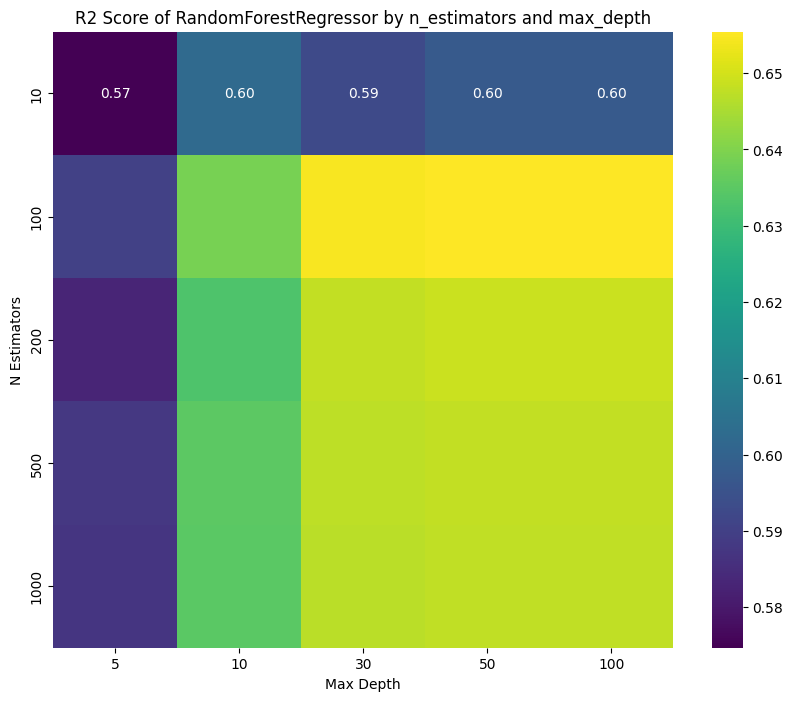

In [44]:
results_pivot = results_df.pivot(index='n_estimators', columns='max_depth', values='r2_score')

# Plotting
plt.figure(figsize=(10, 8))
sns.heatmap(results_pivot, annot=True, fmt=".2f", cmap="viridis")
plt.title('R2 Score of RandomForestRegressor by n_estimators and max_depth')
plt.xlabel('Max Depth')
plt.ylabel('N Estimators')
plt.show()

In [45]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor

# Define the parameter grid to search
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Initialize the RandomForest
rf = RandomForestRegressor()

# Initialize the RandomSearchCV object
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = param_dist, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

# Fit the model
rf_random.fit(X_train, y_train)

# Best parameters
print(rf_random.best_params_)


Fitting 3 folds for each of 100 candidates, totalling 300 fits


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.2s
[CV] END max_depth=30, max_features=l

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.6s
[CV] END max_depth=20, max_feature

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   1.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.3s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=400; total time=   0.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=400; total time=   0.3s
[CV] END max_depth=30, max_feature

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.1s
[CV] END max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.8s
[CV] END max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.8s
[CV] END max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.3s
[CV] END max_depth=20, max_feature

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.1s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.0s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   3.4s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.2s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.2s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   3.4s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   3.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   0.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   0.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   0.5s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=400; total time=   0.3s
[CV] END max_depth=10, max_featu

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.6s
[CV] END max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.6s
[CV] END max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.7s
[CV] END max_depth=50, max_features=a

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   4.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   4.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   3.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.1s
[CV] END max_depth=20, max_features=lo

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.4s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=400; total time=   3.5s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=400; total time=   3.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=400; total time=   3.8s
[CV] END max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.0s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   2.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, max_featur

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   4.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=40, max_features=log2

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.8s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   5.1s
[CV] END max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.9s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=30, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=30, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END max_depth=30, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.3s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   1.9s
[CV] END max_depth=30, max_feat

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.3s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   3.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   4.0s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   2.6s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   2.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=40, max_features=sqr

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   3.1s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   3.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   3.8s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   2.8s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.9s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   3.0s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.1s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500; total time=   5.8s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500; total time=   5.8s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   3.1s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500; total time=   5.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   3.7s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   3.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.7s
[CV] END max_depth=10, max_featu

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=500; total time=   0.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=500; total time=   0.6s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   1.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=500; total time=   0.5s
[CV] END max_depth=10, max_features=a

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.5s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.5s
[CV] END max_depth=20, max_feature

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   1.2s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.3s
[CV] END max_depth=None, ma

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   3.1s
[CV] END max_depth=None, max_features=

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the d

[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   3.3s
[CV] END max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   2.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, max_features=l

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


{'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 20}


In [46]:
{'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 20}


{'n_estimators': 100,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 20}

In [76]:
regr = RandomForestRegressor(n_estimators=100,min_samples_split=5,min_samples_leaf=2,max_depth=20,max_features='auto')
regr.fit(X_train, y_train)
pred = regr.predict(X_test)
print(pred)
r2_score(y_test,pred)

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[230.8480575  345.82072794 322.26432305 422.00344381 322.65862328
 305.33536417 208.33389341 234.94549833 313.40998935 403.92164849
 384.98873737 342.53756966 382.43393559 382.86924333 397.37818254
 359.48404307 289.10218754 266.13169071 368.14492341 353.19571074
 389.4426731  340.3792848  337.03309544 302.48104008 420.77163016
 334.74277339 381.34445981 383.86740598 385.40120615 313.73184714
 331.89281003 373.19806341 339.96483373 385.56972825 385.73429014
 286.69099594 391.02648711 313.84111672 392.71421759 299.38348067
 421.79018029 303.13372113 394.52075332 349.40539925 394.43868506
 258.87109478 377.28130349 425.89155786 345.28990172 414.68733615
 312.24652922 272.67967917 333.53750532 257.27544018 299.64018659
 251.57932802 338.90738466 219.39304964 410.44830865 336.35048257
 366.88070873 423.90618889 232.13861843 266.42263259 394.16606421
 282.97580966 404.4513353  297.42826997 401.39747302 356.22526043
 410.54158242 301.45039036 401.28938768 314.65199768 437.37635292
 328.45229

0.6452093475615818

In [48]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingRegressor

# Define the parameter grid to search
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.02, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0]
}

# Initialize the GradientBoostingRegressor
gb = GradientBoostingRegressor()

# Initialize the RandomizedSearchCV object
gb_random = RandomizedSearchCV(estimator = gb, param_distributions = param_dist, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

# Fit the model
gb_random.fit(X_train, y_train)

# Print the best parameters found
print(gb_random.best_params_)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END learning_rate=0.05, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=500, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=500, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=400, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=500, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=0.9; total time=   0.1s
[CV] END 

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=0.9; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=200, subsample=1.0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=300, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=200, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=300, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=5, max_features=log2, min_samples_leaf=1, 

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=300, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=300, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   0.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.01, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=300, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=300, subsample=0.6; total time=   0.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, subsample=0.9; total time=   0.8s
[CV] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=300, subsample=0.6; total time=   0.2s
[CV] END learning_rate=0.01, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300, subsample=0.6; total time=   1.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=6, max_features=auto, min_samples_leaf=4

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   1.2s
[CV] END learning_rate=0.01, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, subsample=0.9; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=300, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   1.6s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=300, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=300, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=300, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=400, subsample=0.6; total time=   1.8s
[CV] END learning_rate=0.02, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, subsample=0.7; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, subsample=0.9; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=1.0; total time=   0.0s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=500, subsample=0.6; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=1.0; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=500, subsample=0.6; total time=   0.3s
[CV] END learning_rate=0.02, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=4, max_features=log2, min_samples

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   1.1s
[CV] END learning_rate=0.01, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400, subsample=1.0; total time=   1.8s
[CV] END learning_rate=0.02, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=400, subsample=0.6; total time=   2.5s
[CV] END learning_rate=0.01, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400, subsample=1.0; total time=   1.8s
[CV] END learning_rate=0.02, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=500, subsample=0.6; total time=   0.4s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=0.7; total time=   0.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   2.0s
[CV] END learning_rate=0.02, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.02, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.02, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.05, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500, subsample=0.8; total time=   2.8s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=500, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.05, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   2.3s
[CV] END learning_rate=0.02, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300, subsample=0.6; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=500, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.05, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500, subsample=0.8; total time=   3.0s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=500, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.05, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=400, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   0.2s
[CV] END learning_rate=0.05, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=400, subsample=0.7; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=400, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.02, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=400, subsample=0.6; total time=   1.9s
[CV] END learning_rate=0.01, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   0.2s
[CV] END learning_rate=0.05, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   0.2s
[CV] END learning_rate=0.01, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=6, max_features=log2, min_samples_lea

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   0.2s
[CV] END learning_rate=0.05, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   0.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300, subsample=0.6; total time=   1.0s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400, subsample=1.0; total time=   2.0s
[CV] END learning_rate=0.05, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=300, subsample=0.6; total time=   1.9s
[CV] END learning_rate=0.05, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=0.9; total time=   0.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   0.2s
[CV] END learning_rate=0.05, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=300, subsample=0.6; total time=   1.8s
[CV] END learning_rate=0.05, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=0.9; total time=   0.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200, subsample=1.0; total time=   1.9s
[CV] END learning_rate=0.05, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   2.2s
[CV] END learning_rate=0.1, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200, subsample=1.0; total time=   1.4s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, subsample=0.6; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, subsample=0.9; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, subsample=0.9; total time=   0.0s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300, subsample=1.0; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=1.0; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500, subsample=0.8; total time=   2.9s
[CV] END learning_rate=0.05, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300, subsample=1.0; total time=   1.3s
[CV] END learning_rate=0.05, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=4, max_features=log2, min_samples_le

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=300, subsample=0.6; total time=   1.8s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=1.0; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, subsample=0.9; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300, subsample=1.0; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500, subsample=0.8; total time=   3.0s
[CV] END learning_rate=0.01, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, subsample=0.9; total time=   0.6s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, subsample=0.9; total time=   0.6s
[CV] END learning_rate=0.02, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=400, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200, subsample=1.0; total time=   2.2s
[CV] END learning_rate=0.02, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=400, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200, subsample=1.0; total time=   2.0s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=400, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200, subsample=1.0; total time=   2.1s
[CV] END learning_rate=0.02, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=3, max_features=auto, min_samples_le

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=400, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, subsample=0.8; total time=   0.0s
[CV] END learning_rate=0.02, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=400, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.02, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=400, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=sqrt, min_samples_l

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100, subsample=0.9; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100, subsample=0.9; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100, subsample=0.9; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500, subsample=0.8; total time=   3.9s
[CV] END learning_rate=0.05, max_depth=5, max_features=sqrt, min_samples_lea

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500, subsample=0.8; total time=   4.3s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200, subsample=0.9; total time=   0.6s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200, subsample=0.9; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200, subsample=0.9; total time=   0.8s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=300, subsample=0.9; total time=   2.4s
[CV] END learning_rate=0.05, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=300, subsample=0.9; total time=   2.4s
[CV] END learning_rate=0.05, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=300, subsample=0.9; total time=   2.4s
[CV] END learning_rate=0.01, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=300, subsample=0.8; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   2.3s
[CV] END learning_rate=0.01, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=300, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=300, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.01, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500, subsample=0.8; total time=   3.0s
[CV] END learning_rate=0.05, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   2.4s
[CV] END learning_rate=0.1, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=400, subsample=0.7; total time=   1.8s
[CV] END learning_rate=0.1, max_depth=4, max_features=auto, min_samples_le

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=400, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=400, subsample=0.7; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   3.0s
[CV] END learning_rate=0.1, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=400, subsample=0.7; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=300, subsample=0.9; total time=   1.7s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.05, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200, subsample=0.6; total time=   1.0s
[CV] END learning_rate=0.05, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=300, subsample=0.9; total time=   1.6s
[CV] END learning_rate=0.05, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=500, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200, subsample=0.6; total time=   1.3s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=300, subsample=0.9; total time=   1.8s
[CV] END learning_rate=0.02, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300, subsample=0.6; total time=   1.4s
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=500, subsample=0.9; total time=   0.2s
[CV] END learning_rate=0.02, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300, subsample=0.6; total time=   1.4s
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=500, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=500, subsample=0.9; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300, subsample=0.6; total time=   1.8s
[CV] END learning_rate=0.01, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100, subsample=0.6; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100, subsample=0.6; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100, subsample=0.6; total time=   0.4s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100, subsample=0.7; total time=   0.5s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   2.0s
[CV] END learning_rate=0.01, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, subsample=0.8; total time=   0.0s
[CV] END learning_rate=0.01, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, subsample=0.8; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=0.7; total time=   1.0s
[CV] END learning_rate=0.02, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   2.1s
[CV] END learning_rate=0.02, max_depth=6, max_features=auto, min_samples_lea

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=300, subsample=0.6; total time=   0.2s
[CV] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=300, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=0.7; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500, subsample=0.8; total time=   4.7s
[CV] END learning_rate=0.05, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=300, subsample=0.6; total time=   0.2s
[CV] END learning_rate=0.02, max_depth=3, max_features=log2, min_samples_le

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=400, subsample=0.9; total time=   0.2s
[CV] END learning_rate=0.02, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=400, subsample=0.9; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=0.7; total time=   1.4s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=500, subsample=0.9; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=500, subsample=0.9; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=500, subsample=0.9; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500, subsample=0.6; total time=   2.5s
[CV] END learning_rate=0.05, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200, subsample=0.6; total time=   0.7s
[CV] END learning_rate=0.05, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500, subsample=0.6; total time=   2.5s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.01, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=500, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=500, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.01, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=500, subsample=0.7; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=0.8; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200, subsample=0.6; total time=   1.1s
[CV] END learning_rate=0.1, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=0.8; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, subsample=0.9; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500, subsample=0.8; total time=   1.6s
[CV] END learning_rate=0.1, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, subsample=0.9; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, subsample=0.9; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=7, max_features=log2, min_samples_leaf=2,

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=300, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500, subsample=0.6; total time=   3.1s
[CV] END learning_rate=0.05, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   0.2s
[CV] END learning_rate=0.05, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   0.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.02, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.02, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.02, max_depth=6, max_features=sqrt, min_samples_leaf

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500, subsample=0.8; total time=   2.2s
[CV] END learning_rate=0.02, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500, subsample=0.8; total time=   0.3s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.02, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.02, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500, subsample=0.8; total time=   0.3s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   1.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   1.1s
[CV] END learning_rate=0.01, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=300, subsample=0.7; total time=   1.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=0.6; total time=   0.2s
[CV] END learning_rate=0.01, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=0.6; total time=   0.2s
[CV] END learning_rate=0.01, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=500, subsample=0.6; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=3, max_features=auto, min_samples_lea

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400, subsample=0.6; total time=   1.9s
[CV] END learning_rate=0.1, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400, subsample=0.6; total time=   2.0s
[CV] END learning_rate=0.1, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=0.9; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=400, subsample=0.9; total time=   0.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=400, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=400, subsample=0.6; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=500, subsample=0.9; total time=   2.2s
[CV] END learning_rate=0.1, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=400, subsample=0.6; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100, subsample=1.0; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100, subsample=1.0; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100, subsample=1.0; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=400, subsample=0.7; total time=   0.1s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.01, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=400, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500, subsample=0.9; total time=   1.9s
[CV] END learning_rate=0.01, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=400, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=400, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400, subsample=0.6; total time=   2.7s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=400, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500, subsample=0.9; total time=   2.2s
[CV] END learning_rate=0.05, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=400, subsample=1.0; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500, subsample=0.9; total time=   2.2s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.1, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=1.0; total time=   1.4s
[CV] END learning_rate=0.1, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=1.0; total time=   1.5s
[CV] END learning_rate=0.1, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200, subsample=1.0; total time=   1.5s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END learning_rate=0.05, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   2.3s
[CV] END learning_rate=0.05, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   2.4s
[CV] END learning_rate=0.05, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=400, subsample=0.8; total time=   2.5s


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

{'subsample': 0.9, 'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 3, 'learning_rate': 0.05}


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

In [49]:
{'subsample': 0.6, 'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 4, 'learning_rate': 0.05}


{'subsample': 0.6,
 'n_estimators': 200,
 'min_samples_split': 10,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 4,
 'learning_rate': 0.05}

In [50]:
regr = GradientBoostingRegressor(subsample=.6,n_estimators=200,min_samples_split=10,min_samples_leaf=2,max_features='auto',max_depth=4,learning_rate=.05)
regr.fit(X_train, y_train)
pred = regr.predict(X_test)
print(pred)
r2_score(y_test,pred)

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[188.12342716 375.74117064 316.66603195 429.18995927 316.57403741
 288.90083128 199.86977533 256.70899706 283.820472   396.96365285
 397.86904377 356.45384025 377.88033925 362.62236241 385.43184818
 347.55073596 272.1728768  272.47766207 407.69589197 362.01846573
 421.7723055  327.8957213  332.24965101 286.42037747 425.25396244
 350.09420479 379.35702056 382.83481122 374.62345699 324.43687441
 327.42424591 350.27557037 384.87870147 389.11676224 417.92538763
 249.01309136 387.19826169 318.37371012 444.82793374 299.85569734
 424.36803773 296.86909469 403.67674886 339.33061688 381.54973991
 223.73047126 363.19560151 443.70426569 358.66779613 436.39398123
 320.41524637 261.36349615 328.77291711 265.40552303 298.64680382
 246.61223853 370.57220569 214.25281668 441.64381232 330.63668859
 366.7973682  421.70435514 181.68074814 281.860684   381.46967603
 286.99253857 401.01324544 307.15055196 387.70086503 394.85014097
 424.93928335 307.161286   393.09774485 314.88668088 416.79813578
 341.55504

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(


0.6786735039860754

In [51]:
from sklearn.ensemble import GradientBoostingRegressor

# Assuming gb_random is your RandomizedSearchCV object
best_params = gb_random.best_params_
print("Best parameters found: ", best_params)

# Create a new model with the best parameters
gb_best = GradientBoostingRegressor(**best_params)

# Fit the model on the entire training data
gb_best.fit(X_train, y_train)

# Now you can use gb_best to make predictions
# Assuming X_test is your test dataset
predictions = gb_best.predict(X_test)
r2_score(y_test,predictions)


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

Best parameters found:  {'subsample': 0.9, 'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 3, 'learning_rate': 0.05}


/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

0.6756386349499055

In [52]:
{'subsample': 0.6, 'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 4, 'learning_rate': 0.05}


{'subsample': 0.6,
 'n_estimators': 200,
 'min_samples_split': 10,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 4,
 'learning_rate': 0.05}

In [53]:
regr = GradientBoostingRegressor(subsample=.6,n_estimators=200,min_samples_split=10,min_samples_leaf=2,max_features='auto',max_depth=4,learning_rate=.05)
regr.fit(X_train, y_train)
pred = regr.predict(X_test)
print(pred)
r2_score(y_test,pred)

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[187.27116316 370.711192   319.71562983 435.71584482 344.71179842
 282.58830432 195.76527455 259.76983799 287.19119121 413.56052633
 397.39186838 344.32917965 384.52841647 371.69743546 387.21129199
 382.71881378 287.65007552 280.01128917 407.56753277 365.49646223
 406.68199966 333.22134693 335.47226317 282.49540829 425.64838246
 356.56906505 368.26101377 386.22607473 382.36248084 324.02059945
 341.38931883 366.55700796 385.93578383 408.78981405 415.42967738
 267.99822935 396.65586634 321.23620457 406.99202923 301.33089329
 426.64814335 301.99041118 385.32819082 351.93075407 388.05620817
 242.79313648 345.68631496 441.01559673 358.85061163 422.6801501
 307.56481926 282.77441528 330.02821376 246.65523244 300.5960713
 252.02555876 356.45111193 209.96906406 425.73954634 323.80445214
 356.41048416 424.46087582 222.39875875 274.00476652 392.32045102
 275.13124914 397.97974826 313.11199944 398.14446997 397.30979267
 401.03173226 295.20614446 387.63712791 323.01412001 423.30076559
 334.2586287

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

0.676174182056634

In [54]:
test_kag = pd.DataFrame(dataframe_test_tf)

In [55]:
X_train

,square_m,hab,bano,APARTMENT,FLAT,GROUND_FLOOR,PENTHOUSE,STUDIO,000,00h,...,vistas,vivienda,viviendas,vivir,vía,with,zona,zonas,única,útiles
273,106.0,2.0,1.0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
448,93.0,2.0,2.0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
860,93.0,4.0,2.0,0,1,0,0,0,1,0,...,1,1,0,0,1,0,3,0,0,0
539,63.0,3.0,1.0,0,1,0,0,0,0,0,...,1,1,0,0,0,0,0,0,1,0
289,65.0,5.0,2.0,0,1,0,0,0,0,0,...,0,2,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74,84.0,3.0,2.0,0,1,0,0,0,0,0,...,0,2,0,2,0,0,0,0,0,0
405,80.0,1.0,1.0,0,1,0,0,0,0,0,...,0,1,0,1,0,0,1,0,0,0
119,82.0,3.0,1.0,0,1,0,0,0,0,0,...,0,2,0,0,0,0,0,0,0,0
709,108.0,2.0,2.0,0,1,0,0,0,0,0,...,0,5,0,0,0,0,0,1,0,0


In [64]:
regr = GradientBoostingRegressor(subsample=.6,n_estimators=200,min_samples_split=10,min_samples_leaf=2,max_features='auto',max_depth=4,learning_rate=.05)
regr.fit(X_train, y_train)
pred = regr.predict(X_test)
print(pred)
print(r2_score(y_test,pred))
test_kag = pd.DataFrame(dataframe_test_tf)

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[212.54993094 383.68865572 324.07336808 425.61233676 346.00255413
 294.35615542 199.66832633 251.27557667 285.76155944 407.84056729
 385.79570084 359.66016524 366.27239478 384.28289009 392.28459834
 364.80626008 261.1344851  285.71398601 396.88500252 343.29001898
 395.78858094 330.18241871 337.92108856 281.00980451 422.07597401
 340.97248153 377.31425002 409.15279686 384.14769072 333.95549605
 333.86567512 365.08915285 376.41750789 401.93578447 414.93866623
 255.21954266 396.97009898 327.64575537 421.09835181 301.84441419
 422.44996751 292.81197713 404.89377648 351.50736548 388.11177227
 225.83112076 355.00506747 439.11137897 355.94558853 439.62516513
 335.39649908 284.76831093 327.45091331 255.29832866 300.2994634
 242.76762247 359.25901563 201.16133103 442.76594076 353.12317117
 342.48593154 421.62283195 191.87461048 291.94767448 398.1071068
 279.89940905 376.87444564 310.60262329 397.72420431 384.91008437
 391.4707362  296.33691135 386.03237533 325.27859833 413.45991905
 318.8121316

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

In [77]:
id_nus  = test_kag['id']
test_kag.drop('id', axis=1, inplace=True)
test_kag = test_kag.select_dtypes(include=[np.number])

test_kag

KeyError: 'id'

In [78]:
grad = gb_best.predict(test_kag)
pred = regr.predict(test_kag)
pred

array([337.46957598, 330.56249407, 298.21669974, 383.57745866,
       321.52470927, 390.38438367, 322.86773658, 266.30394143,
       302.90734708, 274.56473736, 346.57819953, 376.02612587,
       375.63252045, 361.25091759, 378.32715946, 294.10377214,
       261.61408457, 391.83611737, 404.58909657, 305.14852911,
       320.13040728, 336.16087871, 248.77808583, 388.9938775 ,
       239.56651866, 261.53865189, 377.01699939, 353.16240117,
       394.34260165, 416.82497937, 313.88112471, 382.97117669,
       406.00153901, 319.19212654, 403.56366286, 322.70313963,
       391.05855495, 282.90048155, 405.30667929, 342.73602049,
       393.8584373 , 406.00153901, 262.53239048, 298.51946564,
       367.61980357, 395.7205423 , 321.51034337, 389.11334892,
       389.02546981, 388.9938775 , 319.64148387, 360.8019876 ,
       293.90661953, 297.08615369, 378.3712543 , 257.6628534 ,
       428.07931718, 390.16236566, 330.33160055, 392.84870422,
       265.31368281, 328.16710052, 385.62711399, 248.27

In [79]:
dataFrame = pd.DataFrame(id_nus)

In [80]:
dataFrame['price'] = grad

In [81]:

dataFrame.to_csv('prediction13.csv',index=False)